## 모델1
best_model.pth 를 crop 이미지에 적용하여 새로운 이미지 생성
Crack 시각화
면적 비율 구간별 개수화
전체 면적에서 Crack이 차지하는 비율 반환

In [2]:
!pip install -q segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.2 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Crop Size: (227, 227)
# Stride: 50
# Sharpening: 커널 기반 필터 적용

import cv2
import numpy as np
from PIL import Image
import torch
import torchvision.transforms.functional as TF
import os
from tqdm import tqdm
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt

def sharpen_image(img_pil):
    img_cv = np.array(img_pil)
    kernel = np.array([[0, -1, 0],
                       [-1,  5,-1],
                       [0, -1, 0]])
    sharpened = cv2.filter2D(img_cv, -1, kernel)
    return Image.fromarray(sharpened)

def slide_crop(image, crop_size=(227, 227), stride=50):
    w, h = image.size
    crops, coords = [], []
    for y in range(0, h - crop_size[1] + 1, stride):
        for x in range(0, w - crop_size[0] + 1, stride):
            box = (x, y, x + crop_size[0], y + crop_size[1])
            crop = image.crop(box)
            crops.append(crop)
            coords.append((x, y))
    return crops, coords

def stitch_mask(crop_preds, coords, image_size, crop_size=(227, 227)):
    full_mask = np.zeros(image_size, dtype=np.float32)
    count_map = np.zeros(image_size, dtype=np.float32)

    for crop_pred, (x, y) in zip(crop_preds, coords):
        crop_np = np.array(crop_pred.resize(crop_size))
        full_mask[y:y+crop_size[1], x:x+crop_size[0]] += crop_np
        count_map[y:y+crop_size[1], x:x+crop_size[0]] += 1.0

    count_map[count_map == 0] = 1.0
    stitched = (full_mask / count_map).astype(np.uint8)
    return stitched

def generate_crop_pseudo_mask(model, device, image_path, save_dir, crop_size=(227,227), stride=50, min_area=20):
    os.makedirs(save_dir, exist_ok=True)
    image = Image.open(image_path).convert("RGB")
    crops, coords = slide_crop(image, crop_size=crop_size, stride=stride)

    preds = []
    for crop in crops:
        crop = sharpen_image(crop)
        input_tensor = TF.to_tensor(TF.resize(crop, (256, 256)))
        input_tensor = TF.normalize(input_tensor, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        input_tensor = input_tensor.unsqueeze(0).to(device)

        with torch.no_grad():
            pred = torch.sigmoid(model(input_tensor)).squeeze().cpu().numpy()
            pred_mask = (pred > 0.5).astype(np.uint8) * 255
            preds.append(Image.fromarray(pred_mask))

    stitched_mask = stitch_mask(preds, coords, image.size[::-1], crop_size=crop_size)

    # 마스크 저장
    base_name = os.path.basename(image_path)
    name_no_ext = os.path.splitext(base_name)[0]
    save_path = os.path.join(save_dir, f"{name_no_ext}_pseudo_mask.png")
    Image.fromarray(stitched_mask).save(save_path)

    # 크랙 필터링: 너무 작은 크랙 제외
    binary_mask = (stitched_mask > 127).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask)

    filtered_mask = np.zeros_like(binary_mask)
    crack_count = 0
    for i in range(1, num_labels):  # 0은 배경
        area = stats[i, cv2.CC_STAT_AREA]
        if area >= min_area:
            filtered_mask[labels == i] = 1
            crack_count += 1

    crack_area_ratio = np.sum(filtered_mask) / (binary_mask.shape[0] * binary_mask.shape[1])

    print(f"[{name_no_ext}] Crack count: {crack_count}, Area ratio: {crack_area_ratio:.4f}")

    # 최종 마스크 저장
    filtered_save_path = os.path.join(save_dir, f"{name_no_ext}_filtered_mask.png")
    Image.fromarray((filtered_mask * 255).astype(np.uint8)).save(filtered_save_path)

    return filtered_mask, crack_count, crack_area_ratio



def visualize_pseudo_mask(image_path, mask_path):
    image = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path).convert("L")

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Pseudo Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

def process_folder(model_path, image_folder, save_dir, crop_size=(227, 227), stride=50, visualize=False):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = smp.UnetPlusPlus(encoder_name='resnet34', encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    os.makedirs(save_dir, exist_ok=True)

    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

    for img_file in tqdm(image_files, desc="Processing images"):
        img_path = os.path.join(image_folder, img_file)
        generate_crop_pseudo_mask(model, device, img_path, save_dir, crop_size, stride)
        if visualize:
            pseudo_mask_path = os.path.join(save_dir, os.path.splitext(img_file)[0] + "_pseudo_mask.png")
            visualize_pseudo_mask(img_path, pseudo_mask_path)



In [5]:
import csv

def process_folder(model_path, image_folder, save_dir, crop_size=(227, 227), stride=113, min_area=30, visualize=False):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = smp.UnetPlusPlus(encoder_name='resnet34', encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    os.makedirs(save_dir, exist_ok=True)
    result_csv_path = os.path.join(save_dir, "crack_analysis.csv")

    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

    with open(result_csv_path, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["Image", "Crack Count", "Crack Area Ratio"])

        for img_file in tqdm(image_files, desc="Processing images"):
            img_path = os.path.join(image_folder, img_file)
            mask, count, area_ratio = generate_crop_pseudo_mask(
                model, device, img_path, save_dir, crop_size, stride, min_area
            )
            writer.writerow([img_file, count, f"{area_ratio:.4f}"])

            if visualize:
                filtered_mask_path = os.path.join(save_dir, os.path.splitext(img_file)[0] + "_filtered_mask.png")
                visualize_pseudo_mask(img_path, filtered_mask_path)

import cv2
import numpy as np

PIXEL_TO_MM = 0.1  # 예: 1 픽셀 = 0.1mm (사용자 환경에 맞게 조정)

def analyze_cracks(mask, min_area=20):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask.astype(np.uint8))

    crack_areas_mm2 = []
    valid_labels = np.zeros_like(labels)

    for i in range(1, num_labels):  # 0은 배경
        area_pixels = stats[i, cv2.CC_STAT_AREA]
        if area_pixels < min_area:
            continue

        area_mm2 = area_pixels * (PIXEL_TO_MM ** 2)
        crack_areas_mm2.append(area_mm2)
        valid_labels[labels == i] = len(crack_areas_mm2)  # 새로운 번호 매기기

    return crack_areas_mm2, valid_labels


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

def visualize_crack_classes_transparent(image_path, crack_areas, labels, min_area=20, save_path=None):
    image = np.array(Image.open(image_path).convert("RGB"))
    overlay = np.zeros_like(image, dtype=np.uint8)

    # 유효 크랙 필터링
    filtered = [(i, area) for i, area in enumerate(crack_areas) if area >= min_area]
    if not filtered:
        print("min_area 이상인 크랙이 없습니다.")
        return [0, 0, 0, 0]

    indices, areas = zip(*filtered)
    min_val, max_val = min_area, max(areas)
    bins = np.linspace(min_val, max_val, 5)  # 4구간

    # 색상: 초록 → 노랑 → 주황 → 빨강
    colors = [
        (0, 255, 0),
        (255, 255, 0),
        (255, 165, 0),
        (255, 0, 0)
    ]

    count_per_bin = [0] * 4
    for idx, area in filtered:
        bin_idx = np.digitize(area, bins, right=True) - 1
        bin_idx = min(max(bin_idx, 0), 3)
        count_per_bin[bin_idx] += 1
        overlay[labels == idx + 1] = colors[bin_idx]

    # 알파 블렌딩
    blended = cv2.addWeighted(image, 0.7, overlay, 0.3, 0)

    # 시각화
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(blended)
    plt.title("Crack Overlay (min_area ~ max, 4 Color Ranges)")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.pie(count_per_bin,
            labels=[f"Range {i+1}" for i in range(4)],
            autopct='%1.1f%%',
            colors=[np.array(c)/255 for c in colors])
    plt.title("Crack Count per Area Range")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()

    return count_per_bin


[Defective (40)] Crack count: 888, Area ratio: 0.2272


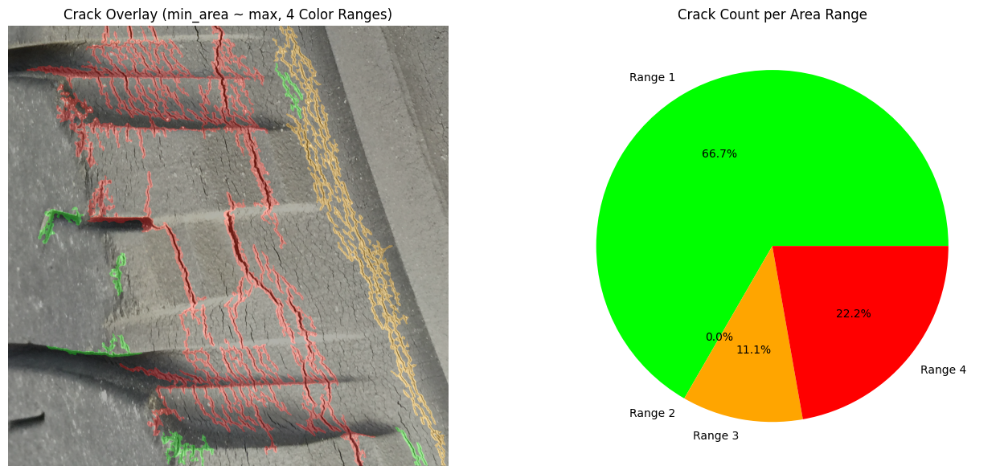

[6, 0, 1, 2]

In [6]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import segmentation_models_pytorch as smp

# ==== 사용자 설정 ====
model_path = "/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/best_model.pth"
image_path = "/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/Defective_train/Defective (40).jpg"
save_dir = "/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/삭제예정"
PIXEL_TO_MM = 0.1
min_area = 0

os.makedirs(save_dir, exist_ok=True)

# ==== 모델 로드 ====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = smp.UnetPlusPlus(encoder_name='resnet34', encoder_weights=None, in_channels=3, classes=1)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# ==== 마스크 생성 ====
filtered_mask, crack_count, area_ratio = generate_crop_pseudo_mask(
    model, device, image_path, save_dir,
    crop_size=(227, 227), stride=50, min_area=min_area
)

# ==== 크랙 면적 및 라벨 분석 ====
def analyze_cracks(mask, min_area=20):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask.astype(np.uint8))

    crack_areas_mm2 = []
    valid_labels = np.zeros_like(labels)

    for i in range(1, num_labels):  # 0은 배경
        area_pixels = stats[i, cv2.CC_STAT_AREA]
        if area_pixels < min_area:
            continue

        area_mm2 = area_pixels * (PIXEL_TO_MM ** 2)
        crack_areas_mm2.append(area_mm2)
        valid_labels[labels == i] = len(crack_areas_mm2)

    return crack_areas_mm2, valid_labels

crack_areas_mm2, valid_labels = analyze_cracks(filtered_mask, min_area)

# ==== 시각화 함수: 크랙 색상 및 파이차트 ====
def visualize_crack_classes(image_path, crack_areas, labels, save_path=None):
    image = np.array(Image.open(image_path).convert("RGB"))
    overlay = image.copy()

    # 구간 설정
    min_area, max_area = min(crack_areas), max(crack_areas)
    bins = np.linspace(min_area, max_area, 6)  # 5개 구간
    bin_indices = np.digitize(crack_areas, bins, right=True) - 1

    # 색상 설정 (빨-주-노-초-파)
    colors = [(255, 0, 0), (255, 165, 0), (255, 255, 0), (0, 255, 0), (0, 0, 255)]
    count_per_bin = [0] * 5

    for i, bin_idx in enumerate(bin_indices):
        count_per_bin[bin_idx] += 1
        overlay[labels == i + 1] = colors[bin_idx]

    # 시각화
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(overlay)
    plt.title("Crack Overlay by Size Range")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.pie(count_per_bin,
            labels=[f"Range {i+1}" for i in range(5)],
            autopct='%1.1f%%',
            colors=[np.array(c)/255 for c in colors])
    plt.title("Crack Count per Size Range")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()

# ==== 시각화 실행 ====
visualize_crack_classes_transparent(
    image_path=image_path,
    crack_areas=crack_areas_mm2,
    labels=valid_labels,
    save_path=os.path.join(save_dir, "crack_transparent_colormap.png")
)


In [7]:
# stride 50 / 80 /113 으로 조정 해서 실험
process_folder(
    model_path="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/best_model.pth",
    image_folder="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/Defective_test",
    save_dir="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/train_pseudo_masks_삭제예정",
    crop_size=(227,227),
    stride=50,
    visualize=True  # True로 하면 각 이미지마다 결과 시각화까지 수행
)

Output hidden; open in https://colab.research.google.com to view.

Processing images:   0%|          | 0/300 [00:00<?, ?it/s]

[Defective (1015)] Crack count: 47, Area ratio: 0.0994


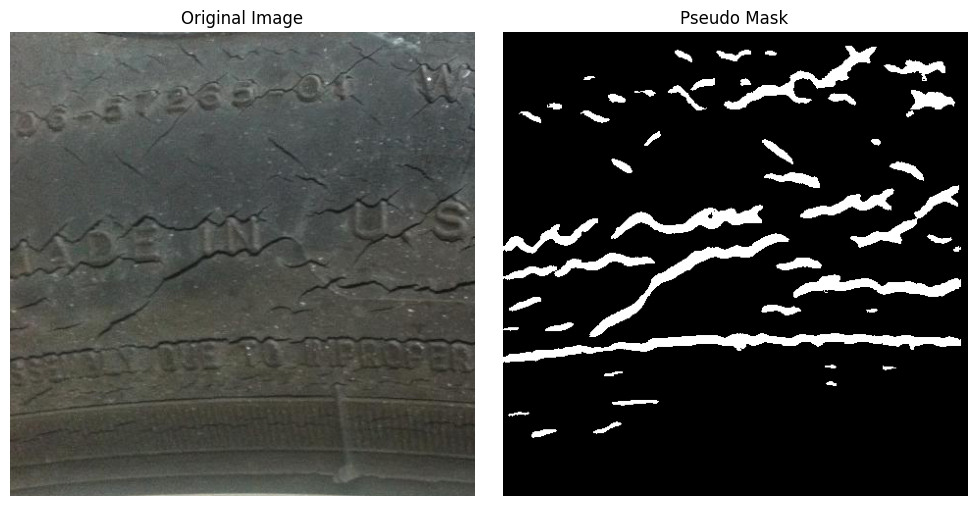

Processing images:   0%|          | 1/300 [00:00<04:04,  1.22it/s]

[Defective (1001)] Crack count: 19, Area ratio: 0.2384


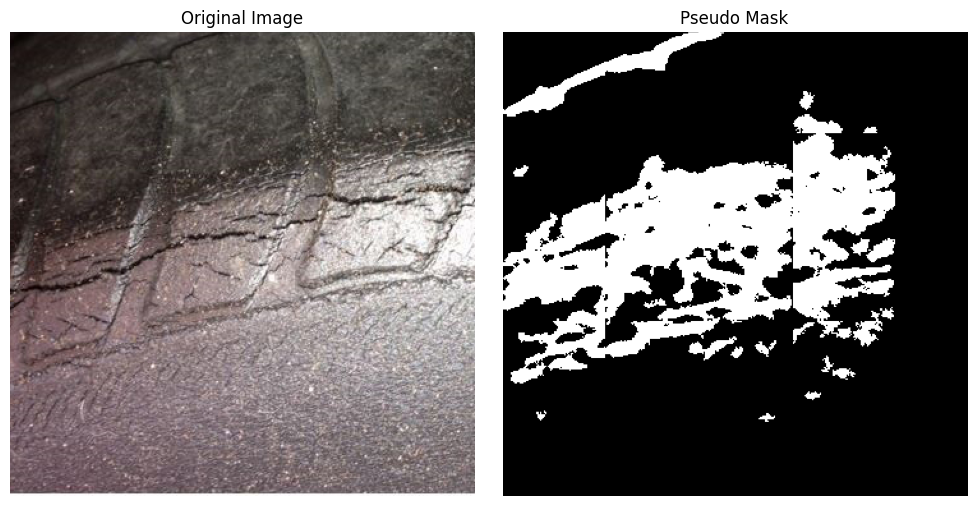

Processing images:   1%|          | 2/300 [00:01<03:11,  1.56it/s]

[Defective (1009)] Crack count: 58, Area ratio: 0.0885


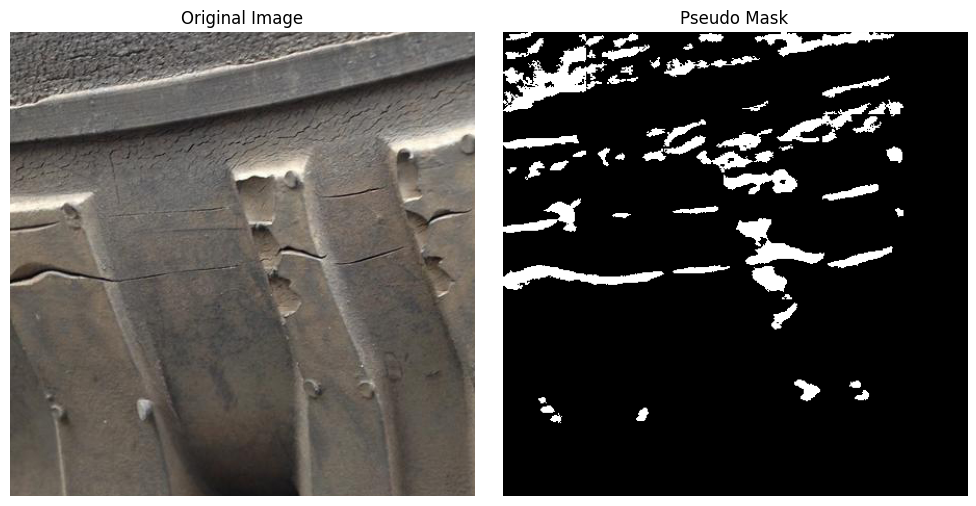

Processing images:   1%|          | 3/300 [00:02<03:16,  1.51it/s]

[Defective (1010)] Crack count: 83, Area ratio: 0.1466


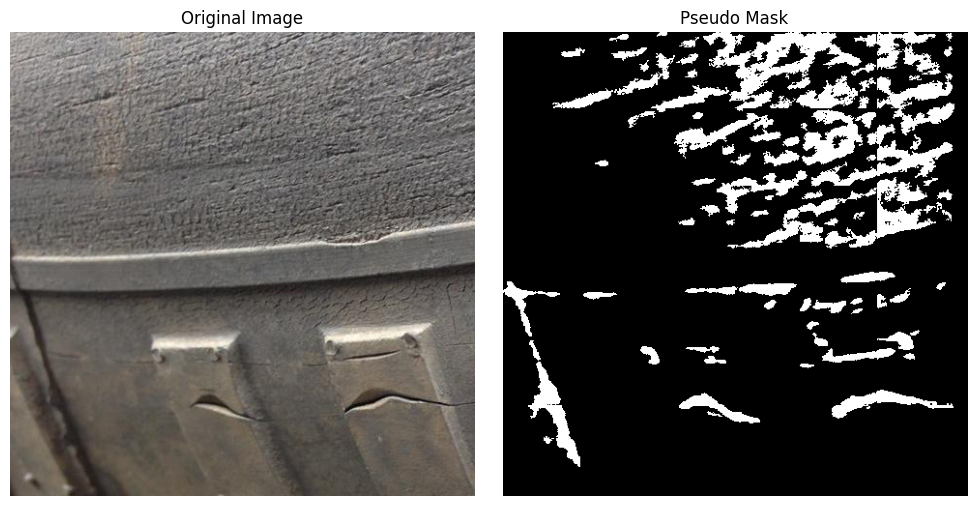

Processing images:   1%|▏         | 4/300 [00:03<04:19,  1.14it/s]

[Defective (1016)] Crack count: 59, Area ratio: 0.1201


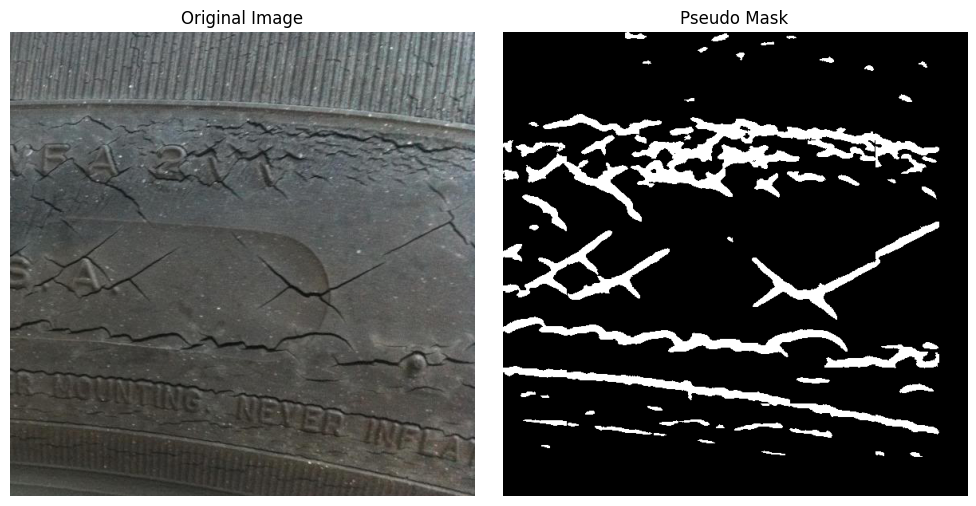

Processing images:   2%|▏         | 5/300 [00:04<04:08,  1.19it/s]

[Defective (1018)] Crack count: 51, Area ratio: 0.0863


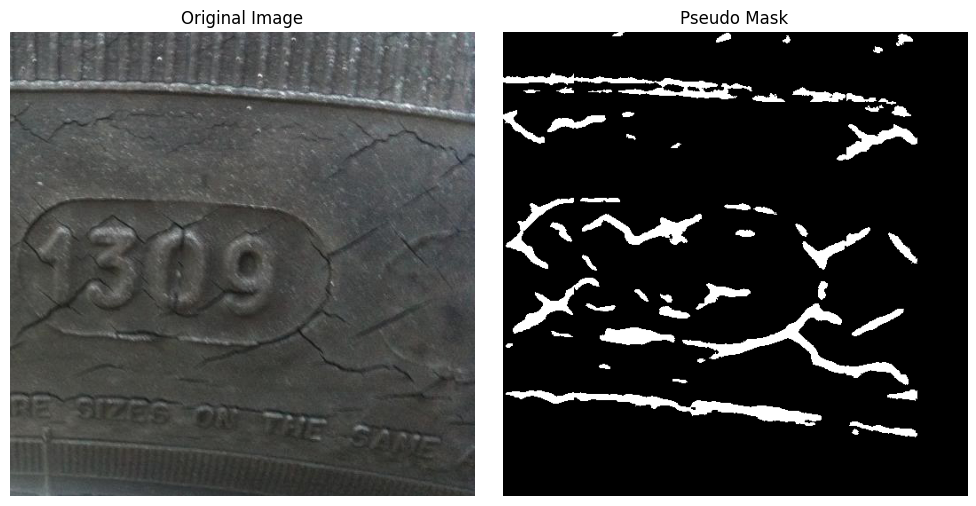

Processing images:   2%|▏         | 6/300 [00:04<03:42,  1.32it/s]

[Defective (1000)] Crack count: 67, Area ratio: 0.0596


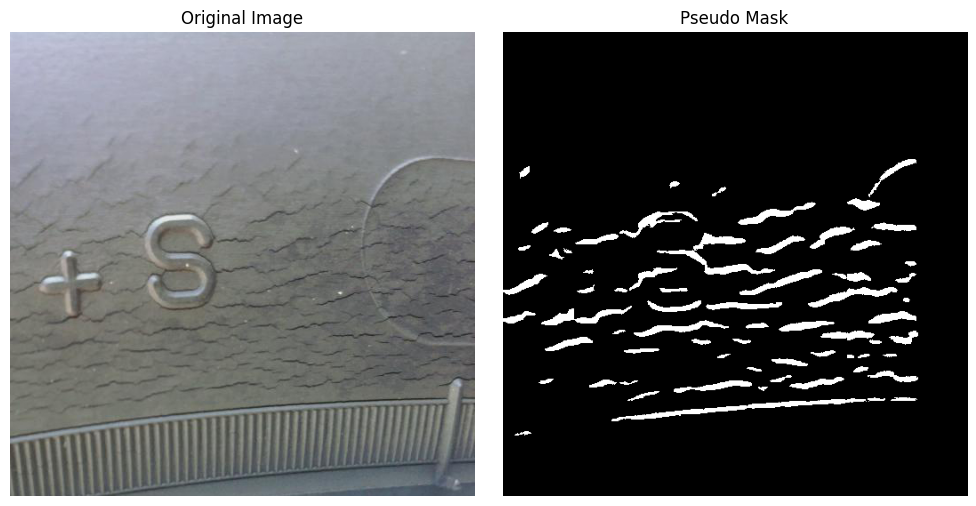

Processing images:   2%|▏         | 7/300 [00:05<03:24,  1.43it/s]

[Defective (1007)] Crack count: 5, Area ratio: 0.0302


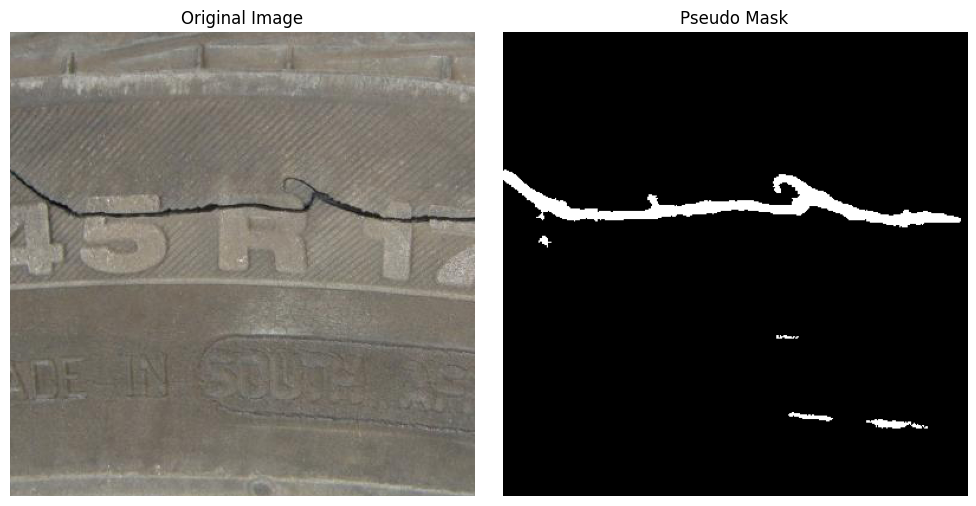

Processing images:   3%|▎         | 8/300 [00:05<03:02,  1.60it/s]

[Defective (1012)] Crack count: 47, Area ratio: 0.0488


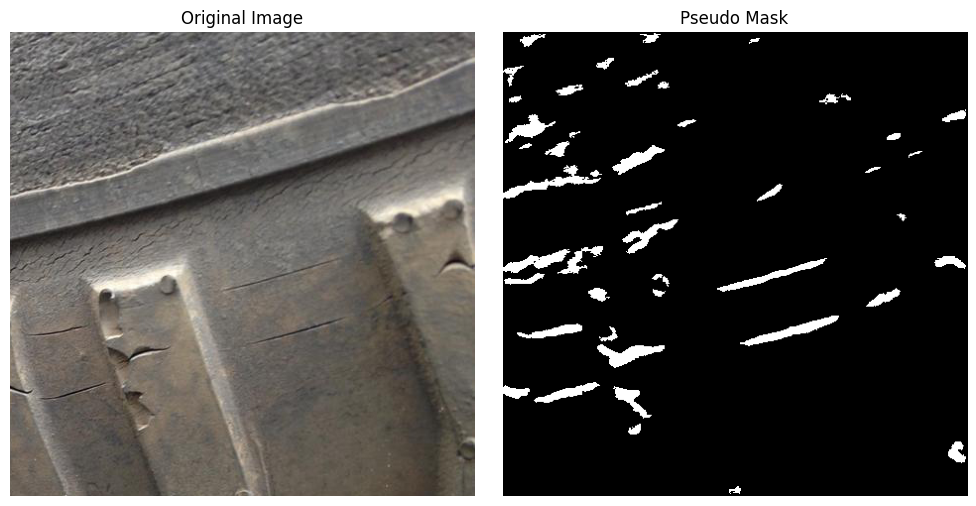

Processing images:   3%|▎         | 9/300 [00:06<02:56,  1.65it/s]

[Defective (1019)] Crack count: 55, Area ratio: 0.0831


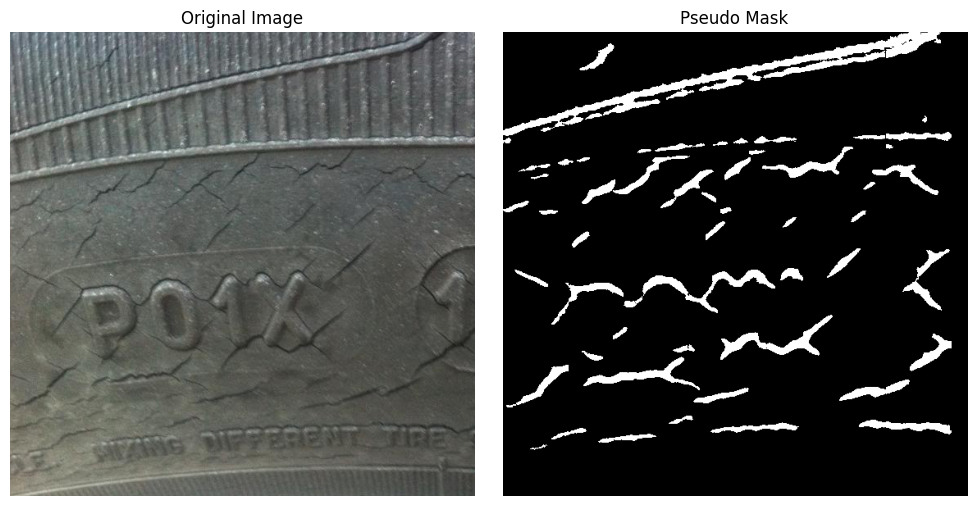

Processing images:   3%|▎         | 10/300 [00:06<03:07,  1.55it/s]

[Defective (1005)] Crack count: 25, Area ratio: 0.1822


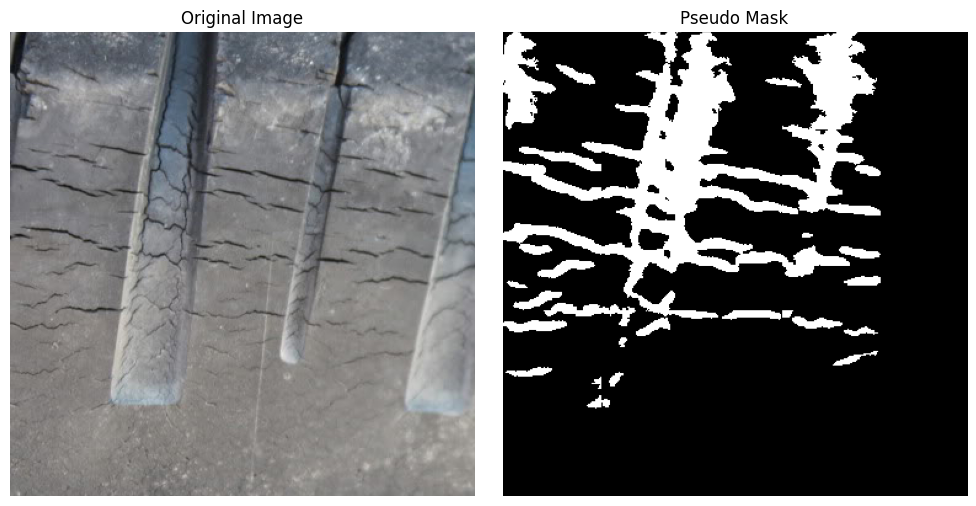

Processing images:   4%|▎         | 11/300 [00:07<02:44,  1.76it/s]

[Defective (1006)] Crack count: 32, Area ratio: 0.0386


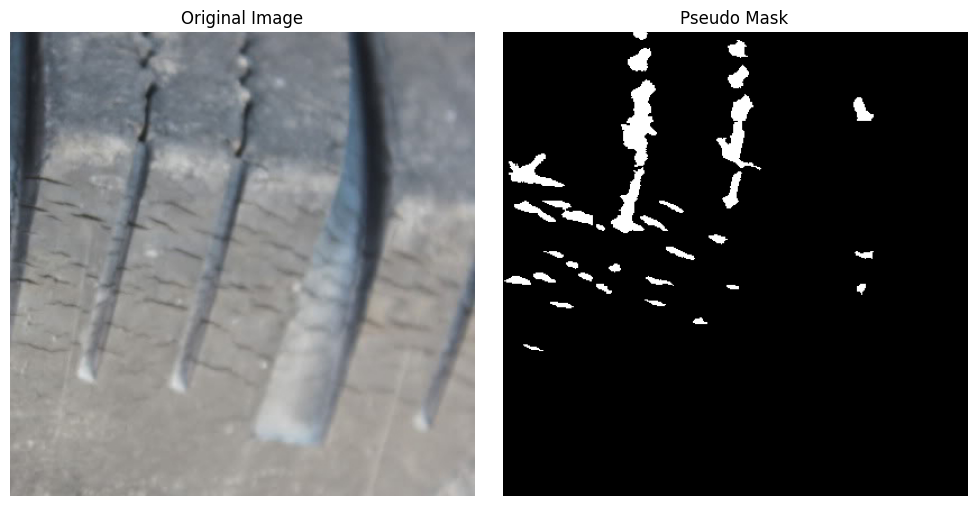

Processing images:   4%|▍         | 12/300 [00:07<02:37,  1.83it/s]

[Defective (1008)] Crack count: 4, Area ratio: 0.0235


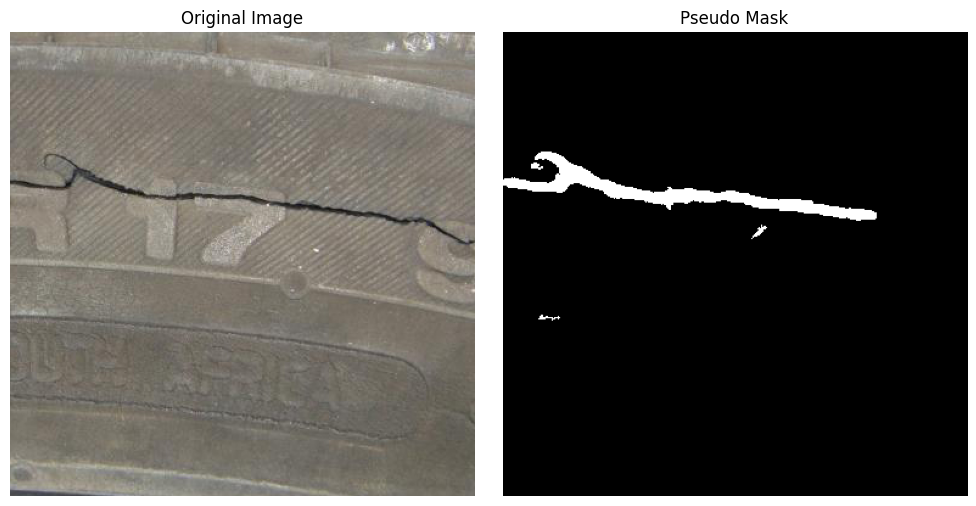

Processing images:   4%|▍         | 13/300 [00:08<02:24,  1.99it/s]

[Defective (1013)] Crack count: 77, Area ratio: 0.0825


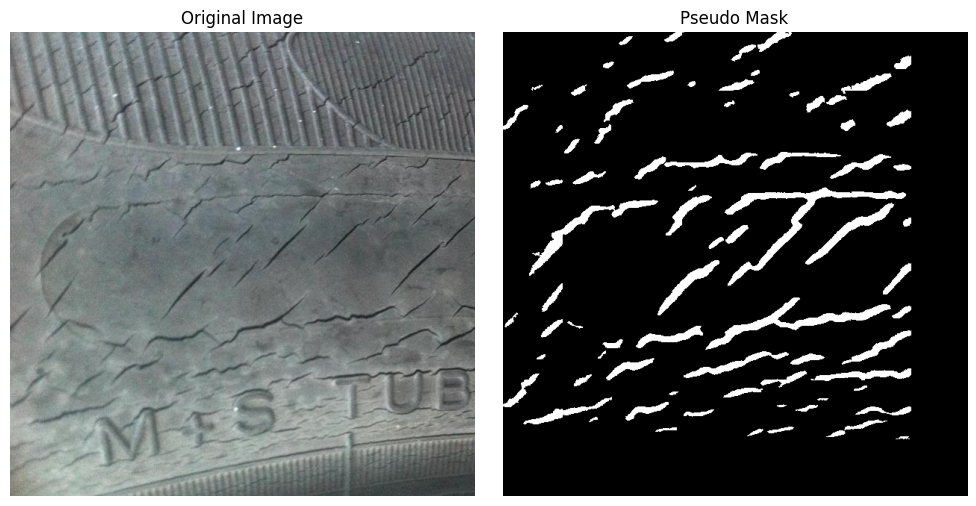

Processing images:   5%|▍         | 14/300 [00:09<02:47,  1.71it/s]

[Defective (1003)] Crack count: 273, Area ratio: 0.0498


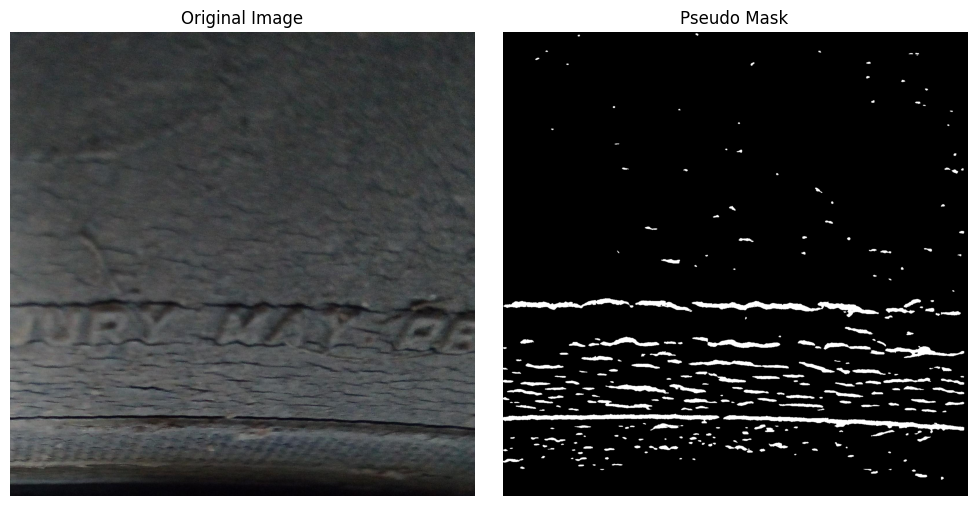

Processing images:   5%|▌         | 15/300 [00:16<12:16,  2.58s/it]

[Defective (1011)] Crack count: 98, Area ratio: 0.1378


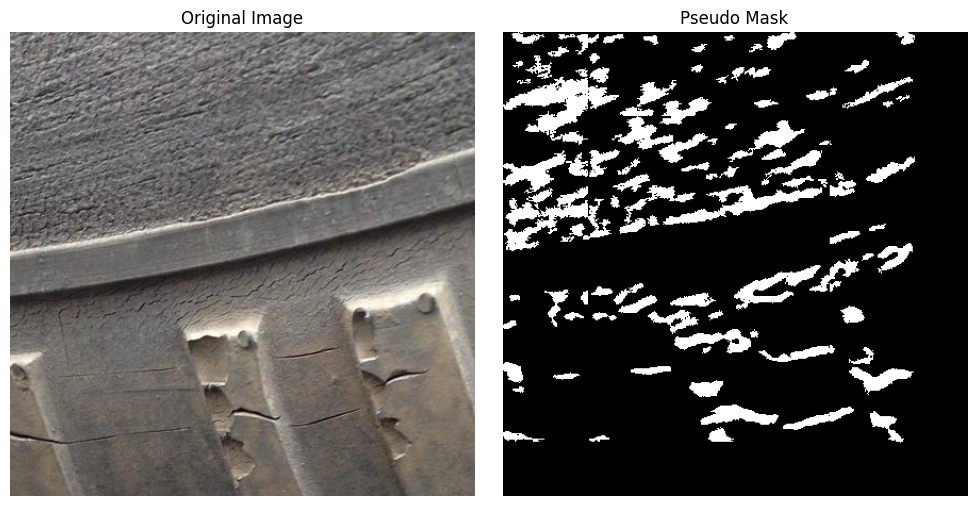

Processing images:   5%|▌         | 16/300 [00:16<09:21,  1.98s/it]

[Defective (1021)] Crack count: 2, Area ratio: 0.0022


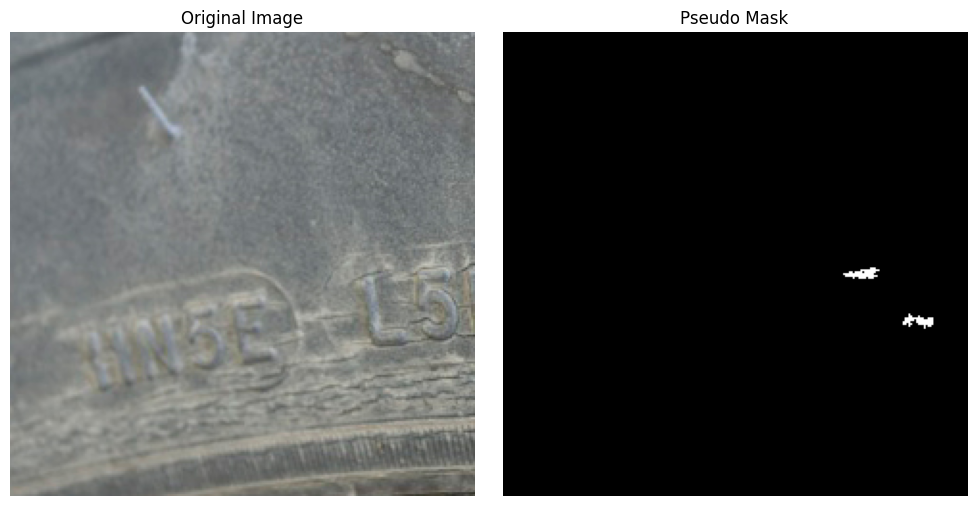

Processing images:   6%|▌         | 17/300 [00:17<07:03,  1.50s/it]

[Defective (1020)] Crack count: 34, Area ratio: 0.0861


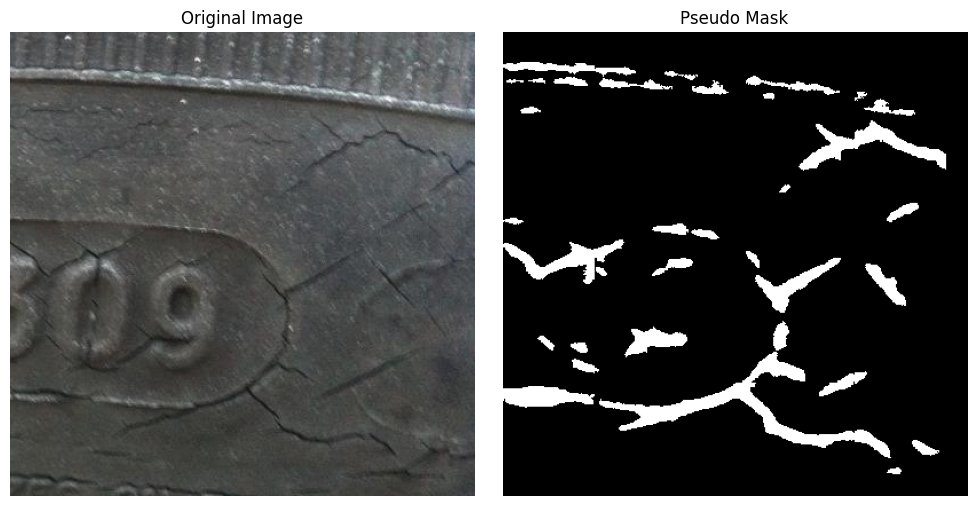

Processing images:   6%|▌         | 18/300 [00:17<05:38,  1.20s/it]

[Defective (1014)] Crack count: 53, Area ratio: 0.1093


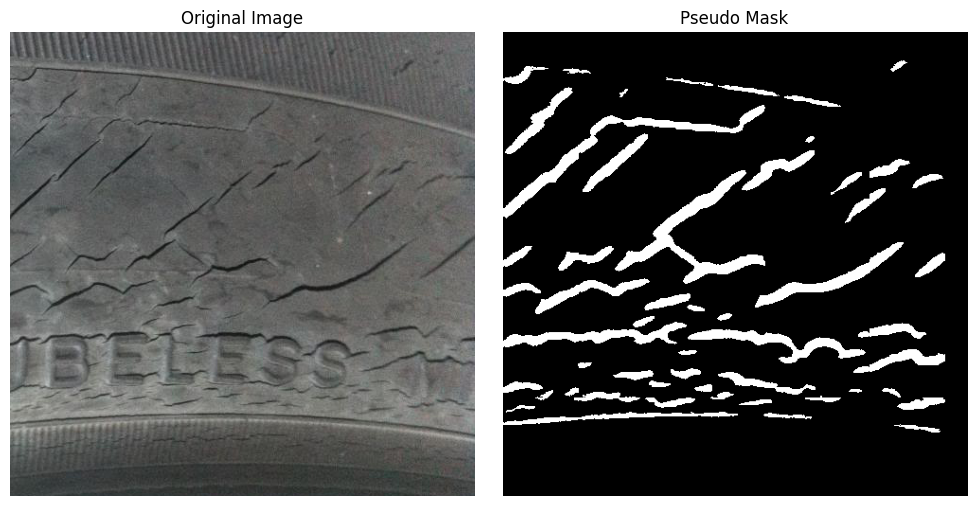

Processing images:   6%|▋         | 19/300 [00:18<04:48,  1.03s/it]

[Defective (1017)] Crack count: 44, Area ratio: 0.0626


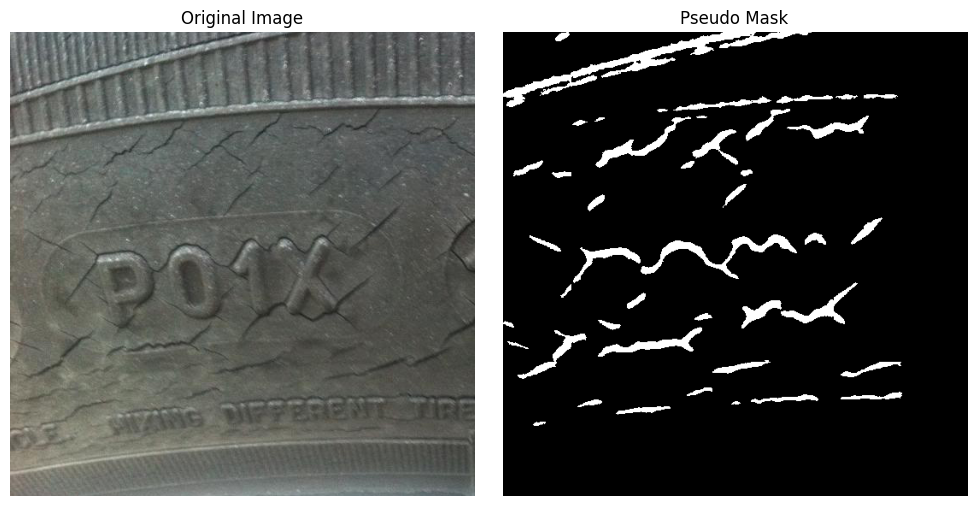

Processing images:   7%|▋         | 20/300 [00:18<04:12,  1.11it/s]

[Defective (1002)] Crack count: 168, Area ratio: 0.0306


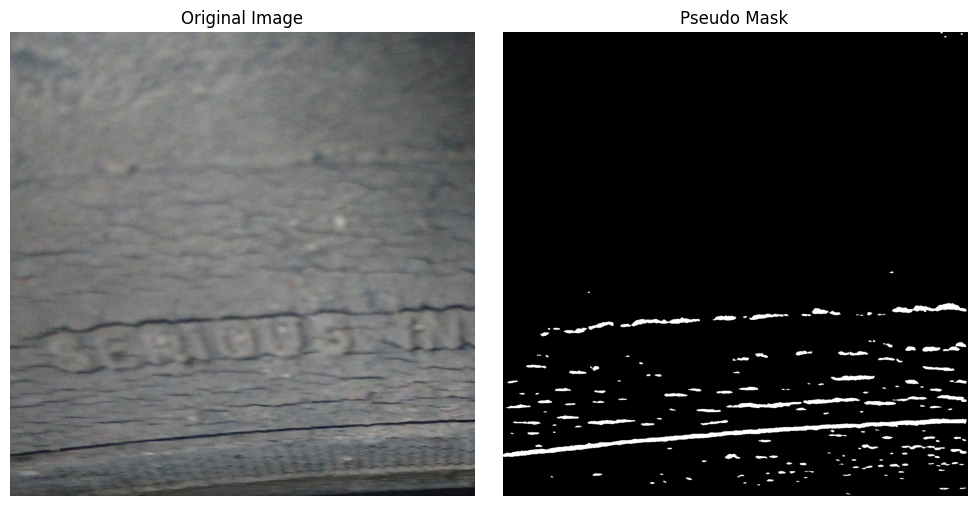

Processing images:   7%|▋         | 21/300 [00:24<11:14,  2.42s/it]

[Defective (1004)] Crack count: 264, Area ratio: 0.0508


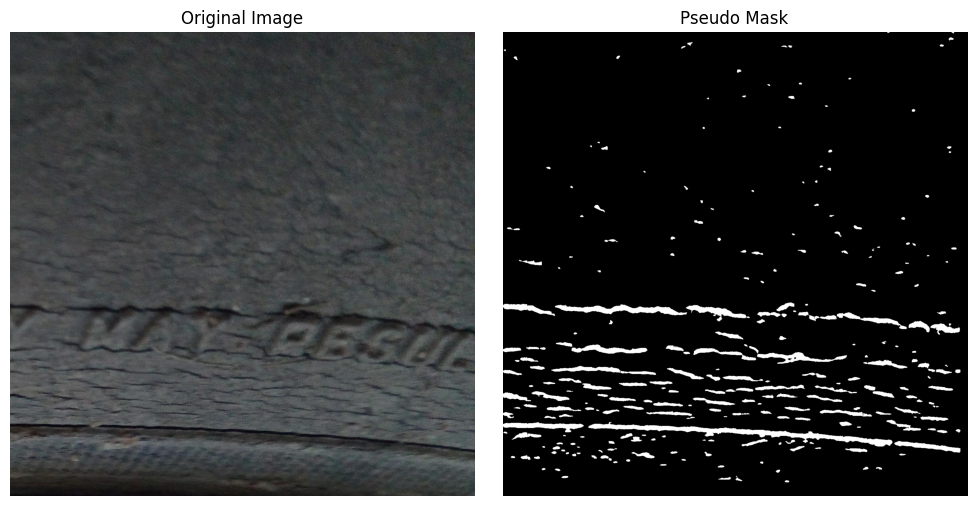

Processing images:   7%|▋         | 22/300 [00:31<16:24,  3.54s/it]

[Defective (1024)] Crack count: 31, Area ratio: 0.3155


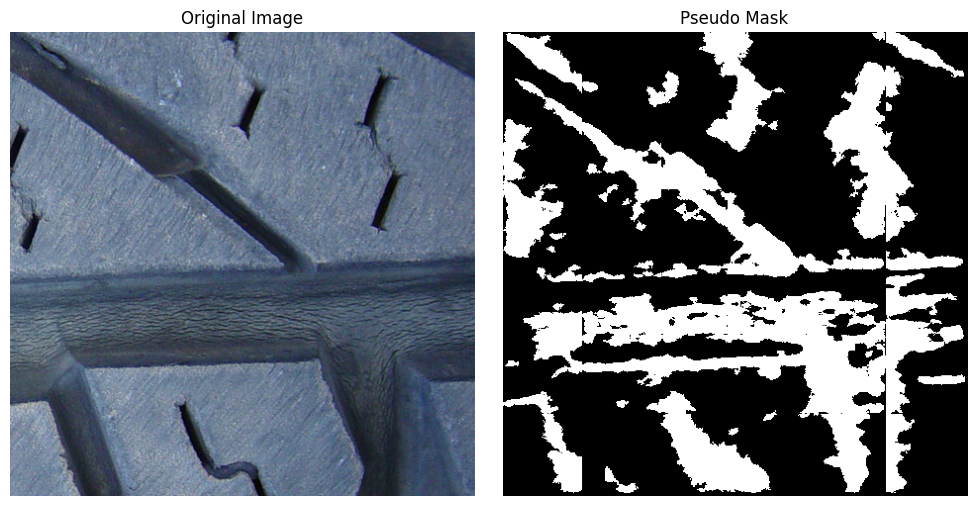

Processing images:   8%|▊         | 23/300 [00:31<12:19,  2.67s/it]

[Defective (1023)] Crack count: 4, Area ratio: 0.2882


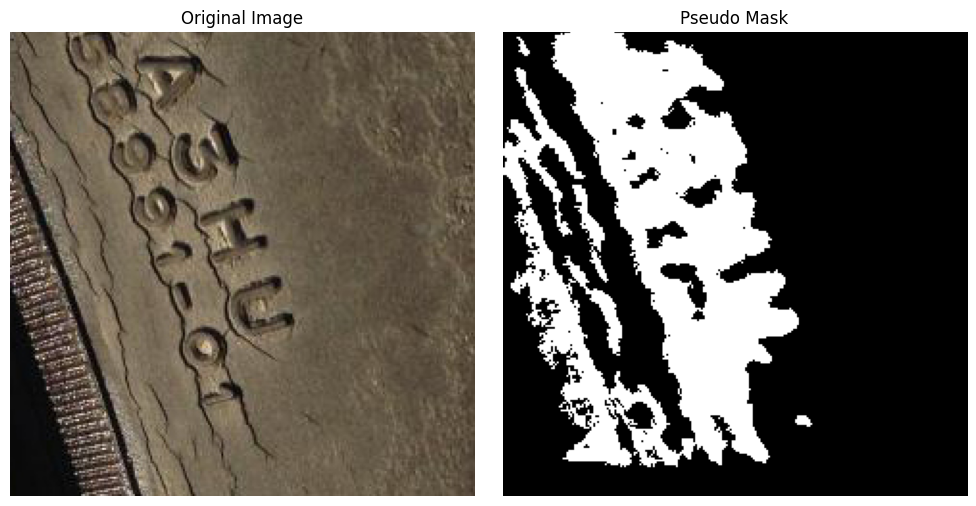

Processing images:   8%|▊         | 24/300 [00:32<09:10,  2.00s/it]

[Defective (1026)] Crack count: 55, Area ratio: 0.1196


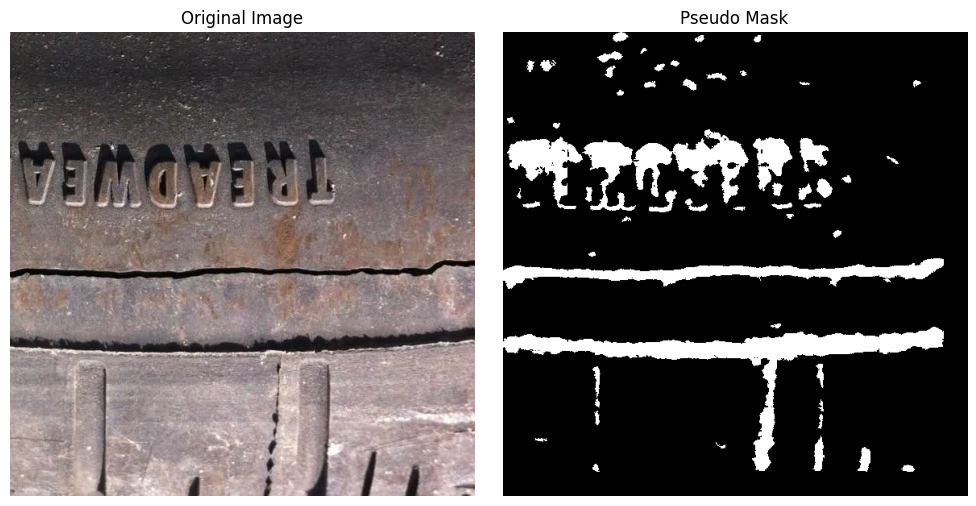

Processing images:   8%|▊         | 25/300 [00:32<07:31,  1.64s/it]

[Defective (1028)] Crack count: 9, Area ratio: 0.1276


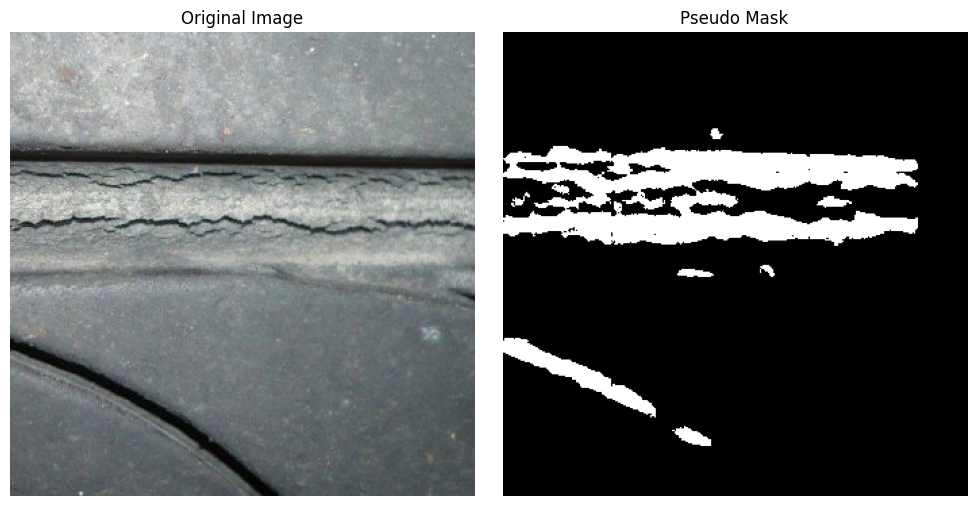

Processing images:   9%|▊         | 26/300 [00:33<05:55,  1.30s/it]

[Defective (1022)] Crack count: 3, Area ratio: 0.3456


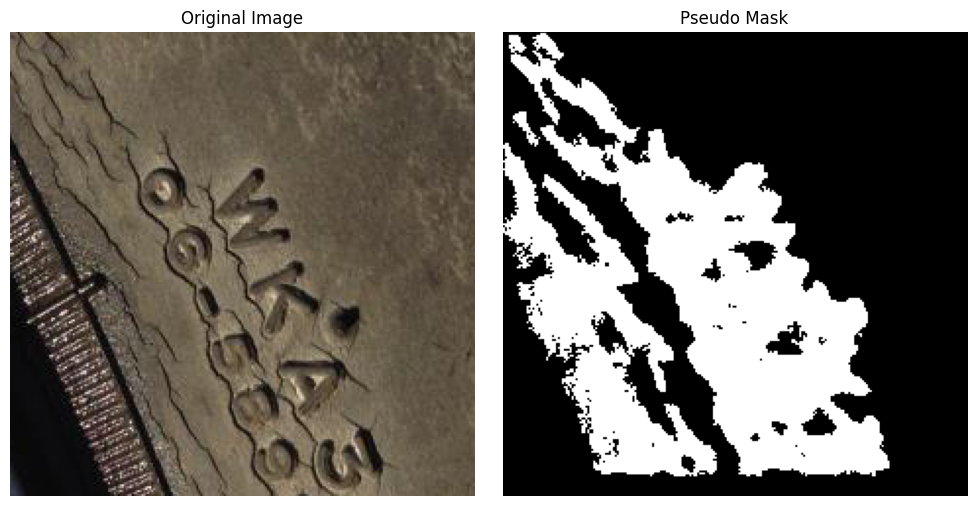

Processing images:   9%|▉         | 27/300 [00:33<04:40,  1.03s/it]

[Defective (1027)] Crack count: 6, Area ratio: 0.1199


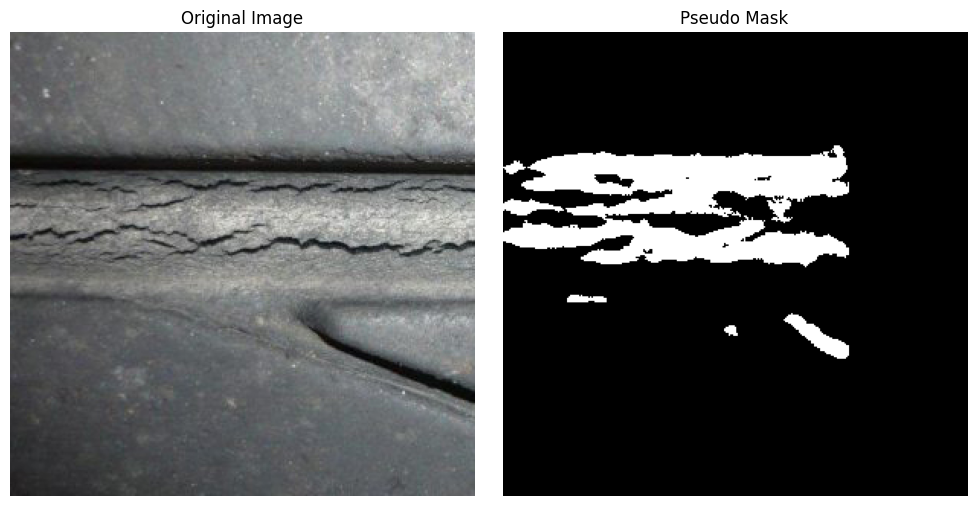

Processing images:   9%|▉         | 28/300 [00:34<03:50,  1.18it/s]

[Defective (1025)] Crack count: 36, Area ratio: 0.1656


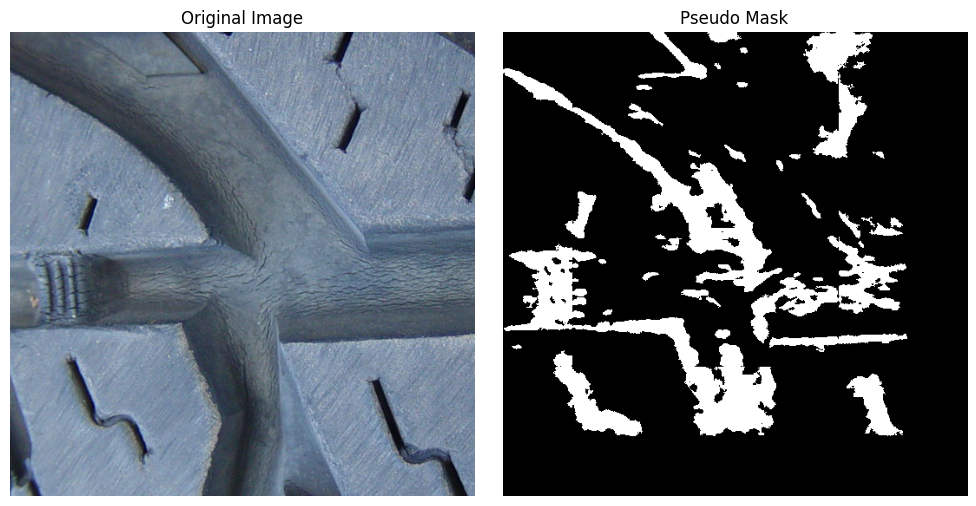

Processing images:  10%|▉         | 29/300 [00:35<03:44,  1.21it/s]

[Defective (729)] Crack count: 2052, Area ratio: 0.0604


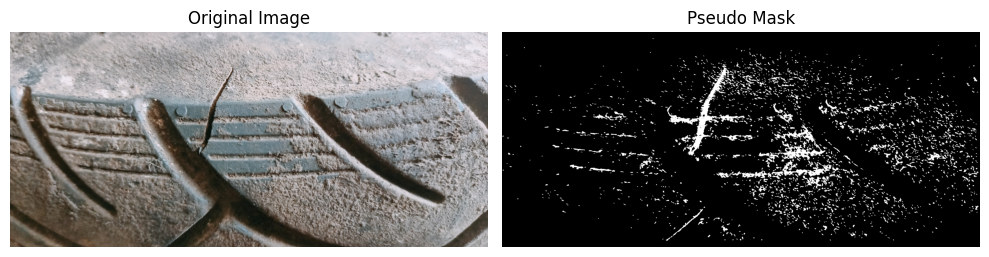

Processing images:  10%|█         | 30/300 [01:00<36:32,  8.12s/it]

[Defective (731)] Crack count: 96, Area ratio: 0.0017


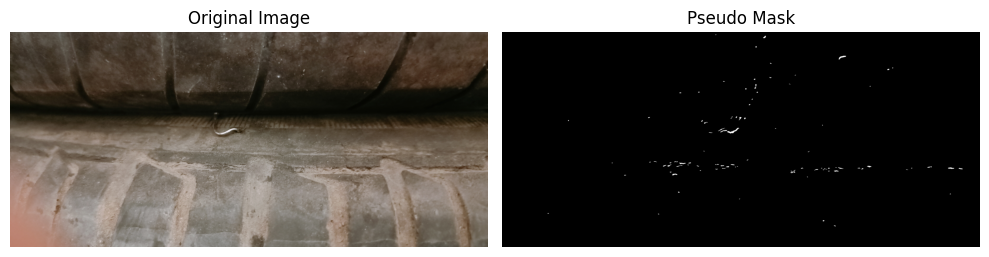

Processing images:  10%|█         | 31/300 [01:17<49:16, 10.99s/it]

In [ ]:
# stride 50 / 80 /113 으로 조정 해서 실험
process_folder(
    model_path="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/best_model.pth",
    image_folder="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/Defective_test",
    save_dir="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/train_pseudo_masks_삭제예정",
    crop_size=(227,227),
    stride=80,
    visualize=True  # True로 하면 각 이미지마다 결과 시각화까지 수행
)

In [ ]:
# stride 50 / 80 /113 으로 조정 해서 실험
process_folder(
    model_path="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/best_model.pth",
    image_folder="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/Defective_test",
    save_dir="/content/drive/MyDrive/Colab Notebooks/KDT_SF_8/최종 프로젝트/train_pseudo_masks_삭제예정",
    crop_size=(227,227),
    stride=113,
    visualize=True  # True로 하면 각 이미지마다 결과 시각화까지 수행
)